# Generate Simulated Data for Algorithm Testing

We need some asteroid data where we know the "ground truth" (e.g. the asteroid period) in order to test our Gaussian Process algorithms and sampling algorithms.

So, let's generate some data with different cadences and different numbers of data points in order to test how well we're doing.

Right now, we're only testing how well we can do assuming that there's a single period with a single waveform for the entire data set. This may not be true in practice, but we have to understand the simpler case first!

First, let's do some imports

In [1]:
%matplotlib notebook
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_context("talk")
sns.set_style("whitegrid")

import numpy as np
import pandas as pd

Let's take a look at the actual data:

In [2]:
datadir = "/Users/danielahuppenkothen/work/data/asteroid_sims/new_shape_models/"

Let's start with *3200 Phaeton*, which has a nicely non-sinusoidal shape:

In [3]:
filename = "3200_lc_49627_to_49787.txt"

In [4]:
data = pd.read_csv(datadir+filename, sep=" ", names=["time", "flux"])

In [5]:
data.head()

,time,flux
0,2.449627e+06,1.031911
1,2.449627e+06,1.031911
2,2.449627e+06,1.032026
3,2.449627e+06,1.031990
4,2.449627e+06,1.031951


<IPython.core.display.Javascript object>


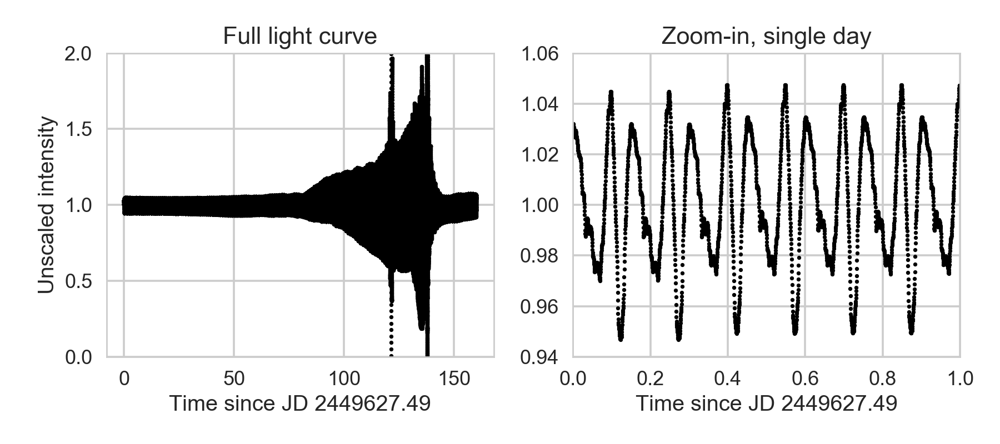

In [6]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9,4))
ax1.scatter(data.time - data.time[0], data.flux, s=5, c="black")
ax1.set_title("Full light curve")
ax1.set_xlabel("Time since JD %.2f"%data.time[0])
ax1.set_ylabel("Unscaled intensity")
ax1.set_ylim(0, 2)

ax2.scatter(data.time - data.time[0], data.flux, s=5, c="black")
ax2.set_title("Zoom-in, single day")
ax2.set_xlabel("Time since JD %.2f"%data.time[0])
ax2.set_xlim(0,1)
ax2.set_ylim(0.94, 1.06)

plt.tight_layout()

We're going to work with the files that *don't* have magnitudes right now, but rather intensity. This is so that we don't have to worry about phase angles. We might apply this to other data later. :)

One thing to note is that if we are making the simplifying assumption of there being (1) no phase angle dependence and (2) no changes in the asteroid light curve waveform, then it strictly doesn't matter whether observations are separated by 1 night or 100. So we can just sample from X consecutive nights (which isn't necessarily similar to real data), which will make the predictions from the Gaussian Process faster.

Let's revisit this later.

Here's a function that can be found in `code/utils.py` that can subsample these finely sampled light curves. Let's use that function to subsample various sampling patterns:

In [7]:
def subsample(time, flux, flux_err=None, npoints=100, kind="random",
              time_unit="days", night_length=8.0, seed=42,
              sigma=0.0, mean_flux=0.0, dnights=[3,6]):
    """
    Subsample an existing high-resolution time series (e.g. simulated) 
    using different sampling patterns.
    
    Parameters
    ----------
    time : numpy.ndarray
        The array of time stamps 
    
    flux : numpy.ndarray
        The array of flux values corresponding to the time 
        stamps in `time`
        
    npoints : int
        The number of data points to sub-sample
        
    kind : str, one of {random | telescope}
        The type of subsampling to perform. 
        There are different sampling patterns currently implemented:
            "random" : randomly sample `npoints` data points from 
                       `time` and `flux1`          
            "telescope": take day/night cycle into account, but randomly 
                         subsample within a "night"
            "sparse" : sparse asteroid sampling: 3 x 1-minute images, separated by 21-minute intervals,
                                                 whole night, for K nights in a row and N nights per semester
            "ztf" : 
            
    time_unit : str
        The unit of time that the `time` array is in.
    
    night_length : float
        The length of a night in hours for including day/night cycles
                
    seed : int
        Seed for the random number generator. Useful for reproducibility.
    
    dnights : [min_nights, max_nights]
        The minimum and maximum number of nights between consecutive observations. Used for 
        the ZTF-like sampling
        
    Returns
    -------
    tsmall, fsmall, (ferrsmall) : the subsampled time series
    """

    if seed is not None:
        np.random.seed(seed)

    if kind == "random":
        # generate a random list of indices for sub-sampling
        idx = np.random.choice(np.arange(0, time.shape[0], 1, dtype=int),
                               size=npoints, replace=False)

        tsmall = time[np.sort(idx)]
        fsmall = flux[np.sort(idx)]
        if flux_err is not None:
            ferrsmall = flux_err[np.sort(idx)]
        else:
            ferrsmall = np.zeros_like(fsmall) + sigma

    elif kind == "telescope":
        # if time unit is in days, convert length of night and day 
        # from hours into days
        if time_unit == "days":
            night_length /= 24.0
            tseg = time[-1] - time[0] # total length of the time series
        else:
            tseg = (time[-1] - time[0]) / 24.0

        nightly_points = int(npoints/tseg)

        tstart = time[0]
        tend = tstart + night_length

        tsmall = []
        fsmall = []

        ferrsmall = []
        while tend <= time[-1]:
            min_ind = time.searchsorted(tstart)
            max_ind = time.searchsorted(tend)

            tshort = time[min_ind:max_ind]
            fshort = flux[min_ind:max_ind]


            idx = np.random.choice(np.arange(0, tshort.shape[0], 1, dtype=int),
                           size=nightly_points, replace=False)

            tsample = tshort[np.sort(idx)]
            fsample = fshort[np.sort(idx)]

            tsmall.append(tsample)
            fsmall.append(fsample)

            if flux_err is not None:
                ferrshort = flux_err[min_ind:max_ind]
                ferrsample = ferrshort[np.sort(idx)]
                ferrsmall.append(ferrsample)
            else:
                ferrsmall.append(np.zeros_like(fsample) + sigma)

            if time_unit == "days":
                tstart += 1.0
                tend += 1.0
            elif time_unit == "hours":
                tstart += 24.0
                tend += 24.0

    elif kind == "sparse":
        if time_unit == "days":
            night_length /= 24.0
            tseg = time[-1] - time[0] # total length of the time series
        else:
            tseg = (time[-1] - time[0]) / 24.0

        tstart = time[0]
        tend = tstart + night_length

        tsmall = []
        fsmall = []

        ferrsmall = []

        start_id = np.random.randint(0, 8, size=1)

        # one minute in fractions of days
        dt = 1./(60*24.)

        # start within the 24-minute interval of observing different asteroids
        tstart += start_id*(3*dt)

        while tend <= time[-1]:

            while tstart <= tend:
                for j in range(3):
                    tind = time.searchsorted(tstart)
                    tsmall.append(time[tind])
                    fsmall.append(flux[tind])

                    if flux_err is not None:
                        ferrsmall.append(flux_err[tind])
                    else:
                        ferrsmall.append(sigma)

                    tstart += dt

                tstart += 21.*dt

            if time_unit == "days":
                tstart += (1.0-night_length)
                tend += 1.0
            elif time_unit == "hours":
                tstart += (24.0 - night_length)
                tend += 24.0
    elif kind == "ztf":

        tstart = time[0]
        total_nights = time[-1] - time[0]

        tsmall = []
        fsmall = []

        nnights = int(npoints/2.)
        if nnights > total_nights:
            raise ValueError("Number of selected nights is longer than total light curve.")

        dnights = np.random.randint(dnights[0], dnights[1], size=npoints)
        dnights[1::2] = 0
        nights = np.zeros(npoints, float) + dnights
        nights = nights.cumsum()

        if np.max(nights) > time[-1]:
            print("Warning! The requested observations are spread over more nights" +
                  " than we currently have data for! Actual number of nights will be smaller!")

        # After 1 month, given field rises 2 hours earlier
        # Let's say we start @ +/- 1 hour of midnight
        start_times = (np.random.random(npoints) * 2.0 - 1.0) * 60.0
        start_times[::2] = start_times[1::2]
        dtimes = np.random.randint(30, 51, size=npoints)
        dtimes[::2] = 0
        times = nights + (start_times  + dtimes) / 60.0 /  24.0 + (nights * -2./24./30.)

        ferrsmall = []
        times += tstart

        for t in times:
            t_ind = time.searchsorted(t)
            tsmall.append(time[t_ind])
            fsmall.append(flux[t_ind])

            if flux_err is not None:
                ferrsmall.append(flux_err[t_ind])
            else:
                ferrsmall.append(sigma)

    fsmall = np.random.normal(np.hstack(fsmall), scale=np.hstack(ferrsmall)) + mean_flux

    return np.hstack(tsmall), np.hstack(fsmall), np.hstack(ferrsmall)


This function can do a bunch of different sampling patterns:
- `random` subsampling, which essentially just pulls $N$ random points out of the data set
- `telescope`-style subsampling: still random subsampling, but now you can define night/day cycles (e.g. 8h night every 24 hours)
- `sparse` subsampling assumes observations every $dt$ seconds during a night for $N$ nights
- `ztf` subsampling approximates the sampling patterns of ZTF and (possibly) LSST

We're going to do a few `telescope` cases, because they're quite simple cases (and might be useful if random subsampling actually improves how we find periods), followed by some sparse and ZTF-like cases. 

For each, we're going to explore how the number of data points per night and the total number of data points affect the results. We are going to survey between 10 and 500 data points, which should cover most of phase space, and vary between 1 and 50 nights. 

We're also going to assume an uncertainty that's 1% of the total variance of the light curve.

In [8]:
npoints = [10, 20, 50, 100, 200, 500]
nnights = [1, 2, 5, 10, 20, 50]

In [9]:
max_nights = 50

In [10]:
max_ind = np.array(data.time).searchsorted(data.time[0] + max_nights)

In [11]:
time = np.array(data.time)[:max_ind]
flux = np.array(data.flux)[:max_ind]

<IPython.core.display.Javascript object>


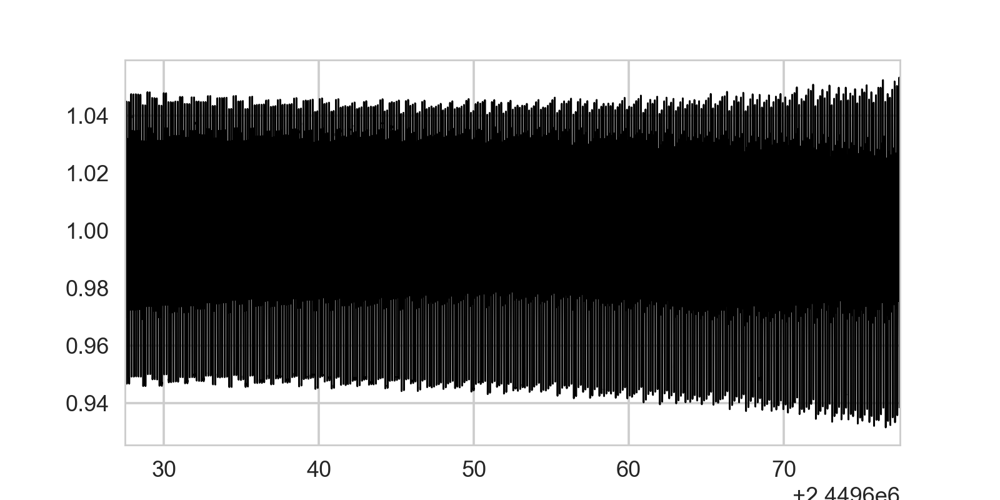

(2449627.4904952785, 2449677.490291607)

In [12]:
fig, ax = plt.subplots(1, 1, figsize=(8,4))
ax.plot(time, flux, lw=1, color="black")
ax.set_xlim(time[0], time[-1])

Let's check whether the waveform changes significantly between the start and the end of those fifty days:

<IPython.core.display.Javascript object>


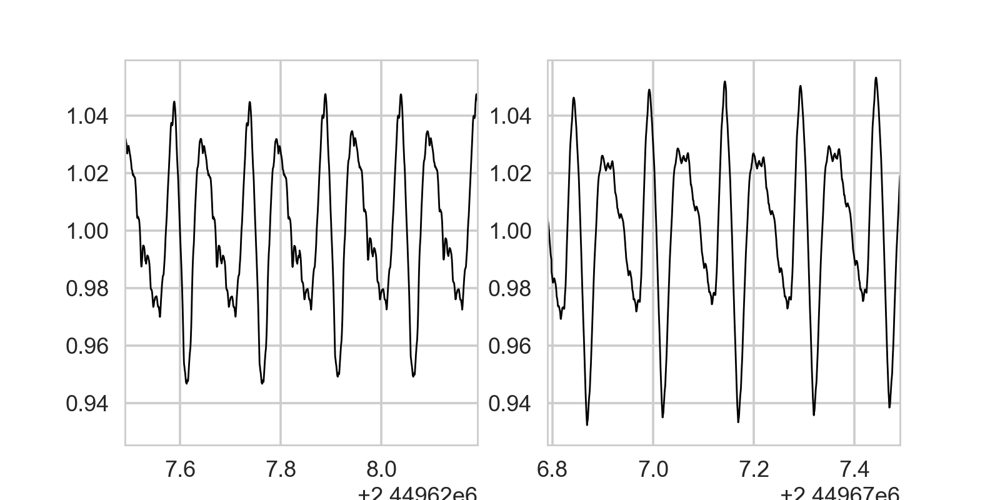

(2449676.790291607, 2449677.490291607)

In [13]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
ax1.plot(time, flux, lw=1, color="black")
ax1.set_xlim(time[0], time[0]+0.7)

ax2.plot(time, flux, lw=1, color="black")
ax2.set_xlim(time[-1]-0.7, time[-1])



That's similar enough that we should be fine, so let's continue with this. We need to define the flux uncertainties. Let's make an array with flux errors based on the standard deviation of the light curve:

In [14]:
flux_err = np.ones_like(flux) * np.std(flux)/10.0

In [15]:
tsample, fsample, ferr_sample = subsample(time, flux, flux_err=flux_err, npoints=100, kind="telescope")

<IPython.core.display.Javascript object>


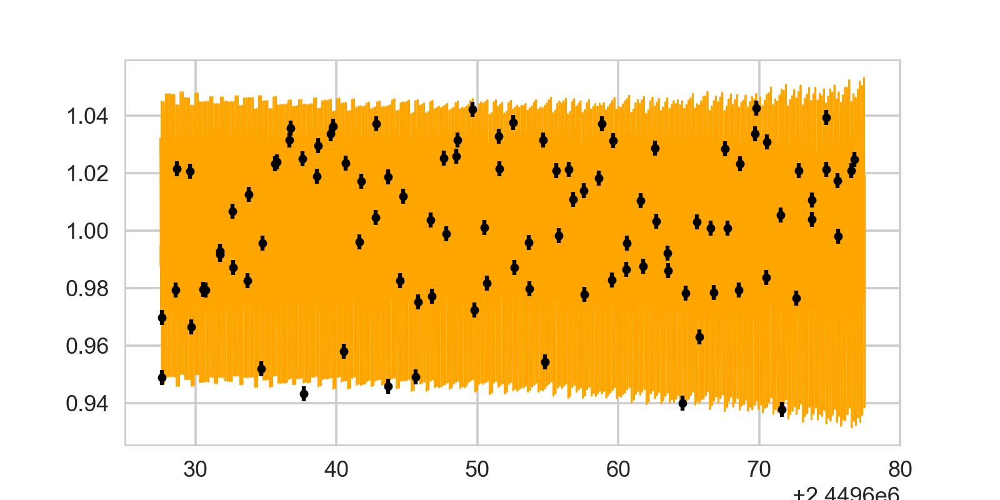

In [16]:
fig, ax = plt.subplots(1, 1, figsize=(8,4))
ax.errorbar(tsample, fsample, yerr=ferr_sample, fmt="o", markersize=5, color="black", zorder=10)
ax.plot(time, flux, lw=1, color="orange")

Note that by definition, I need to have more data points than nights!

## Random Subsampling of Nights

So let's make some data sets where we randomly pick data points within one night:

In [17]:
seed = 200

<IPython.core.display.Javascript object>


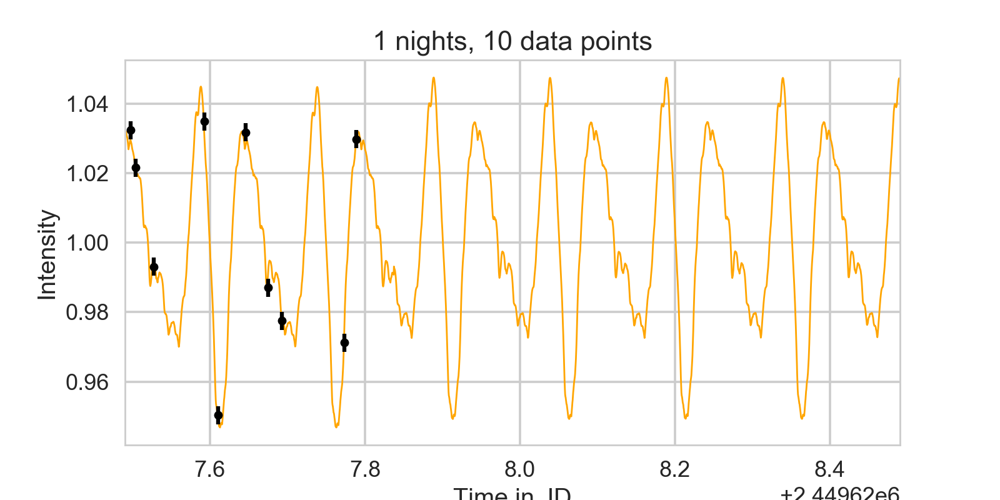

<IPython.core.display.Javascript object>


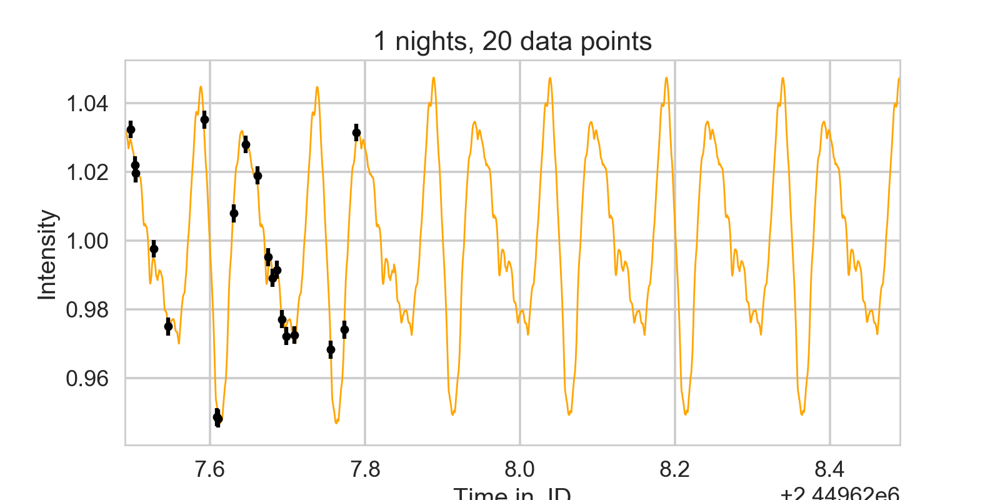

<IPython.core.display.Javascript object>


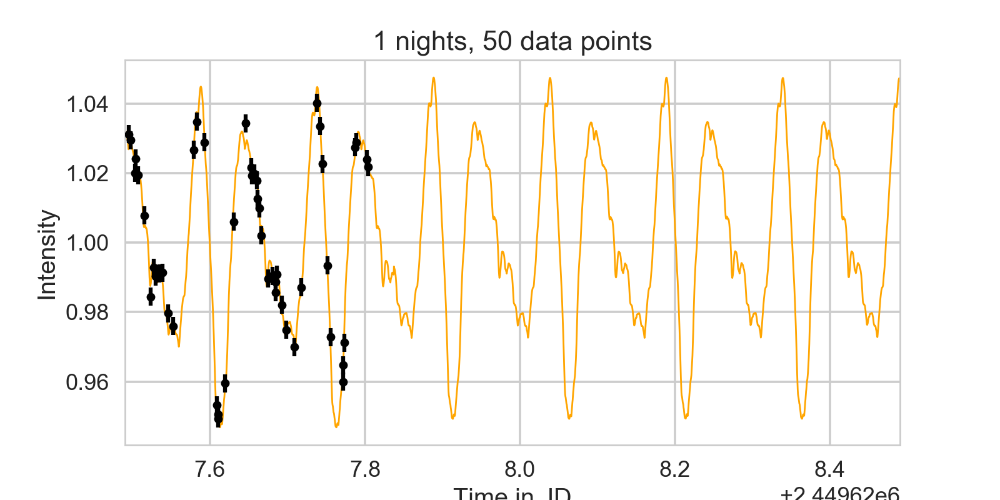

<IPython.core.display.Javascript object>


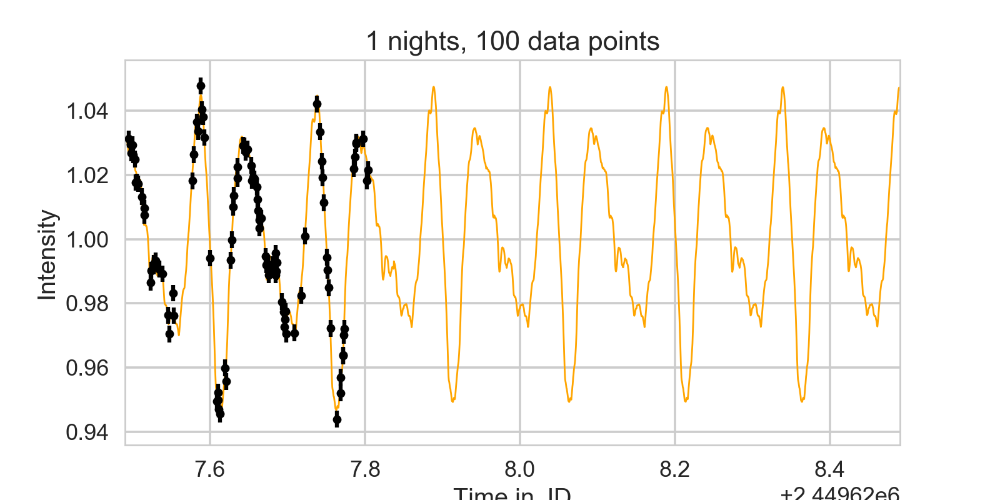

<IPython.core.display.Javascript object>


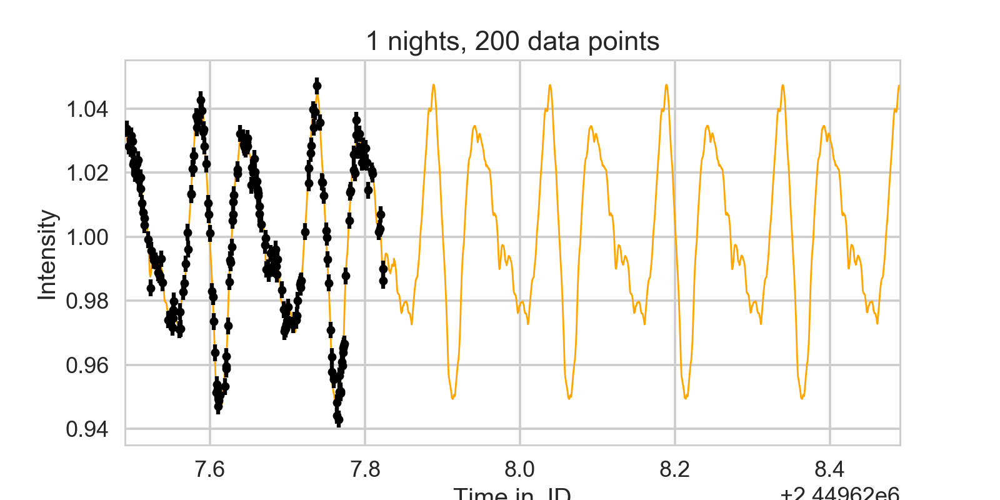

<IPython.core.display.Javascript object>


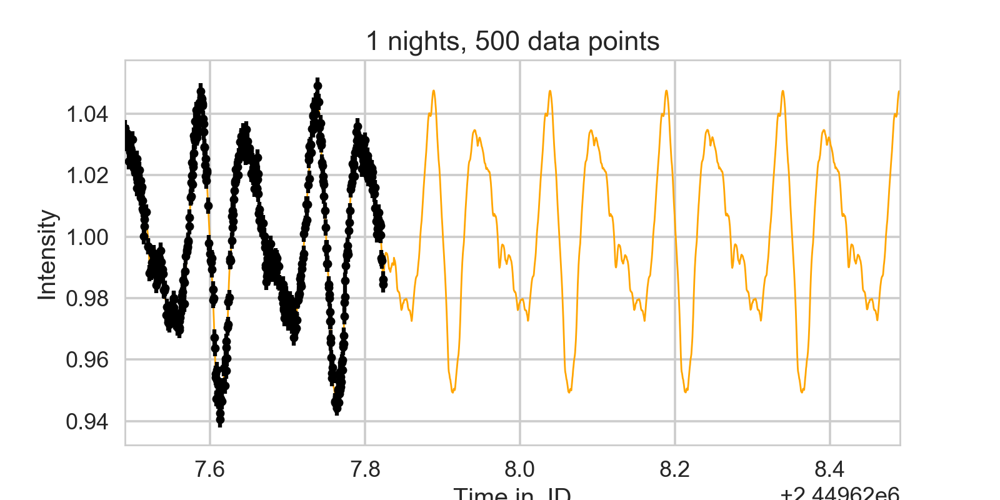

<IPython.core.display.Javascript object>


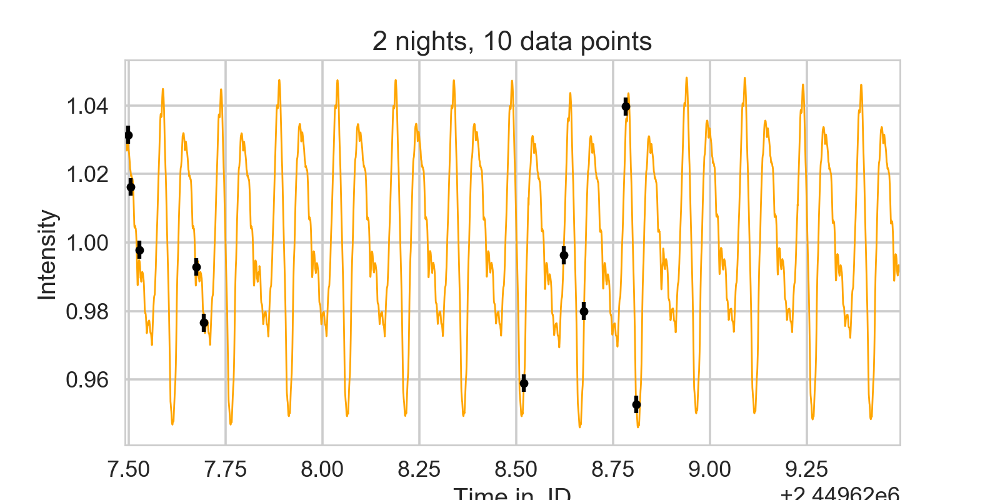

<IPython.core.display.Javascript object>


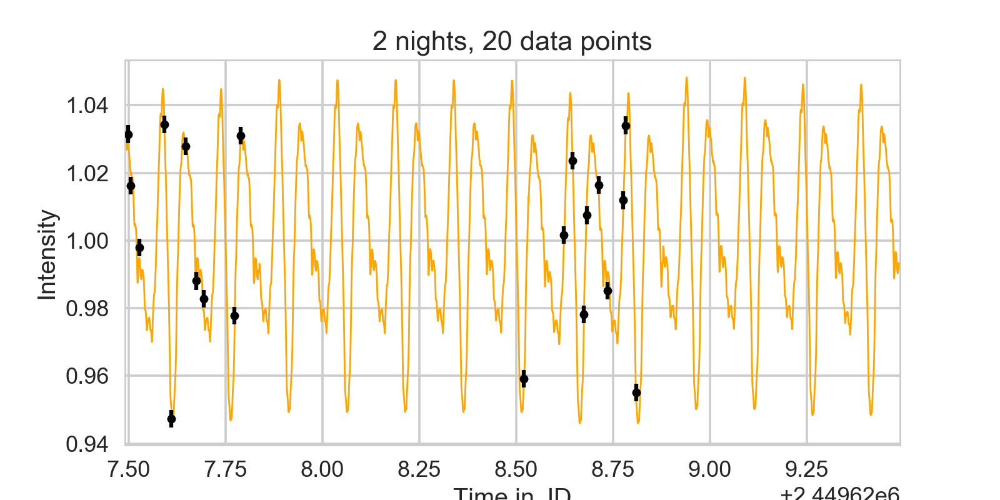

<IPython.core.display.Javascript object>


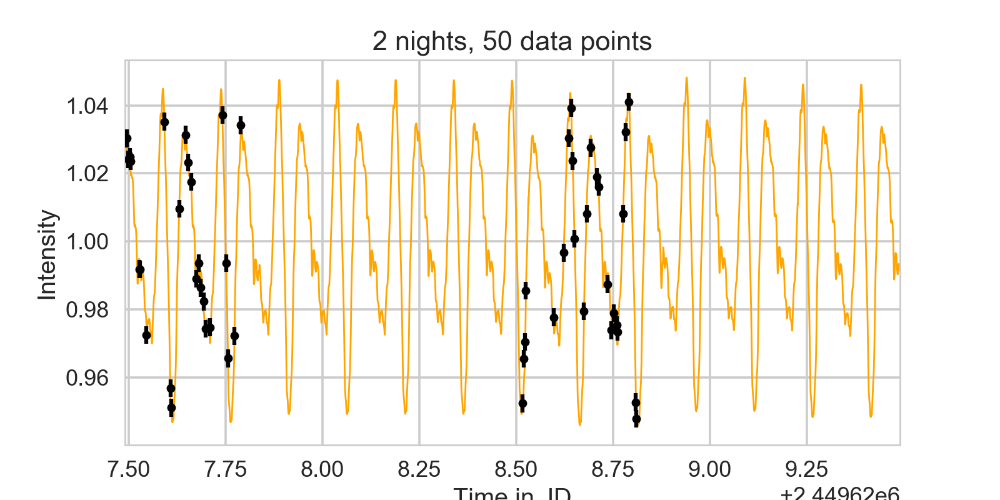

<IPython.core.display.Javascript object>


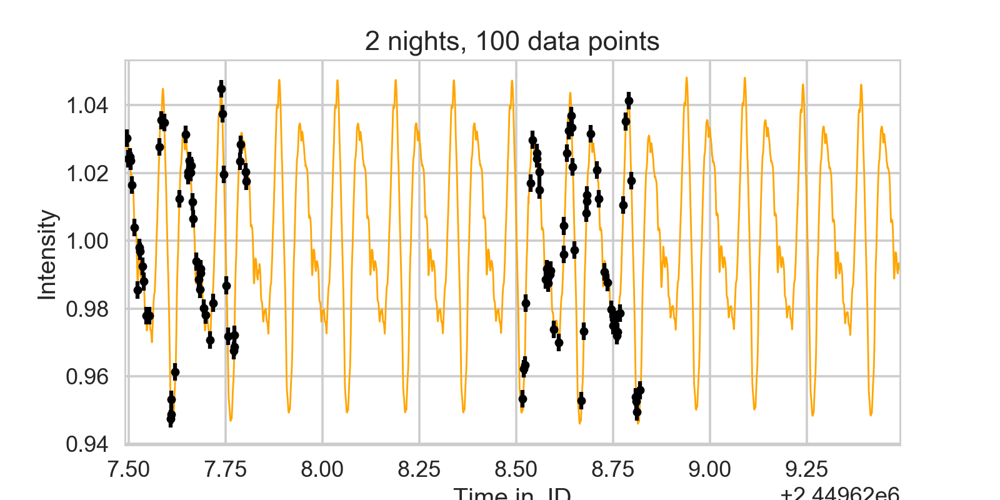

<IPython.core.display.Javascript object>


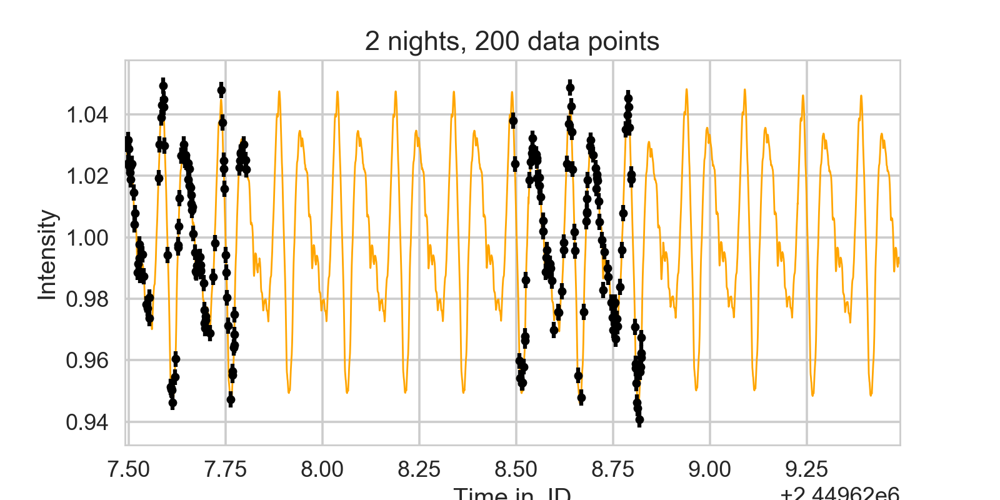

<IPython.core.display.Javascript object>


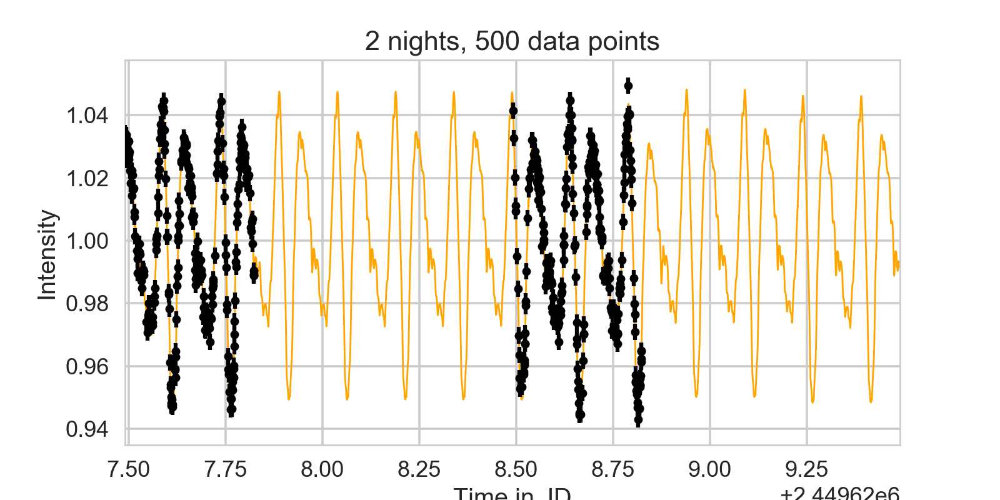

<IPython.core.display.Javascript object>


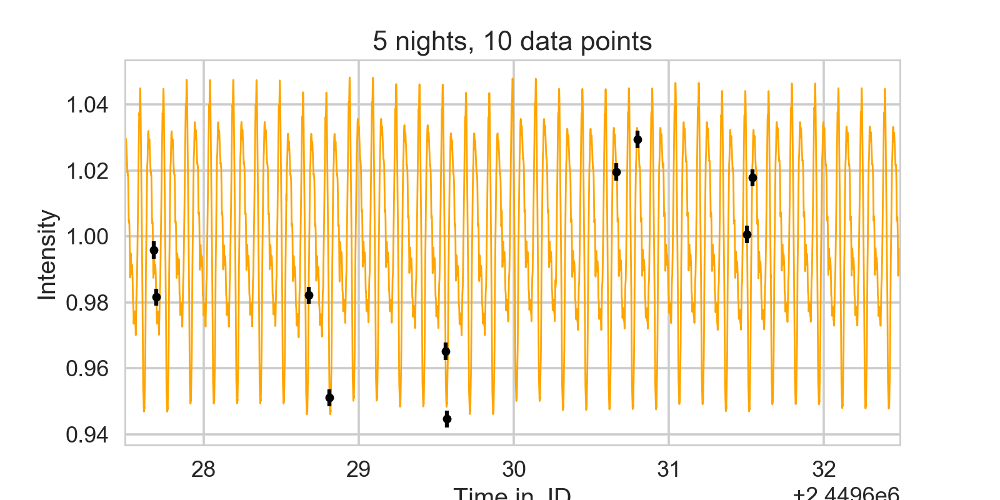

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


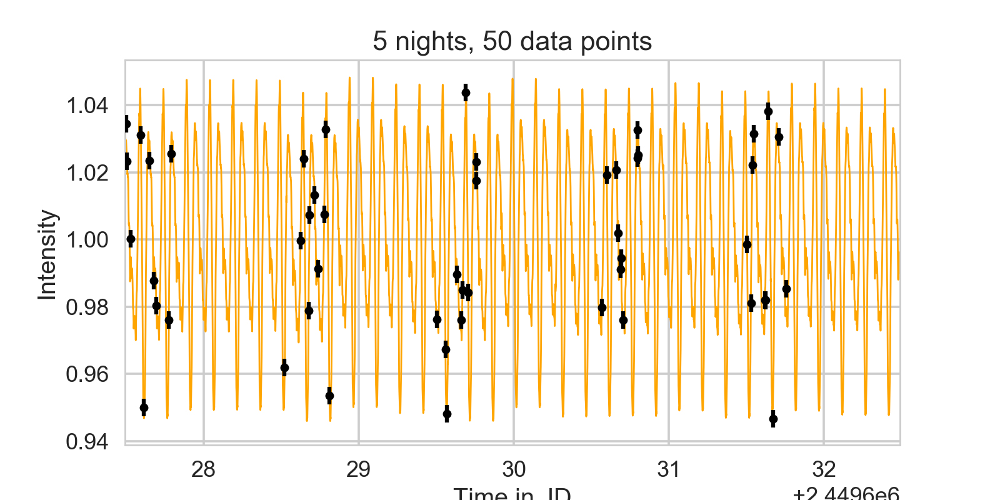

<IPython.core.display.Javascript object>


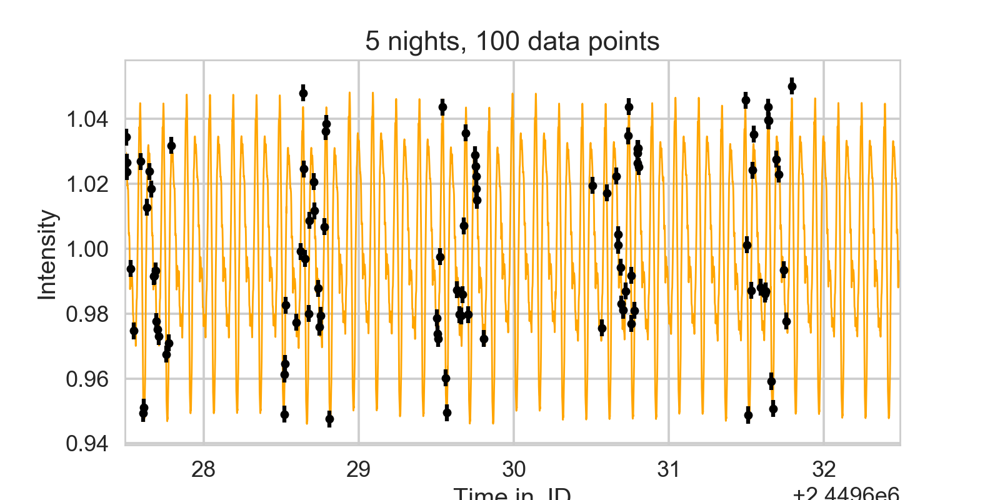

/opt/local/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


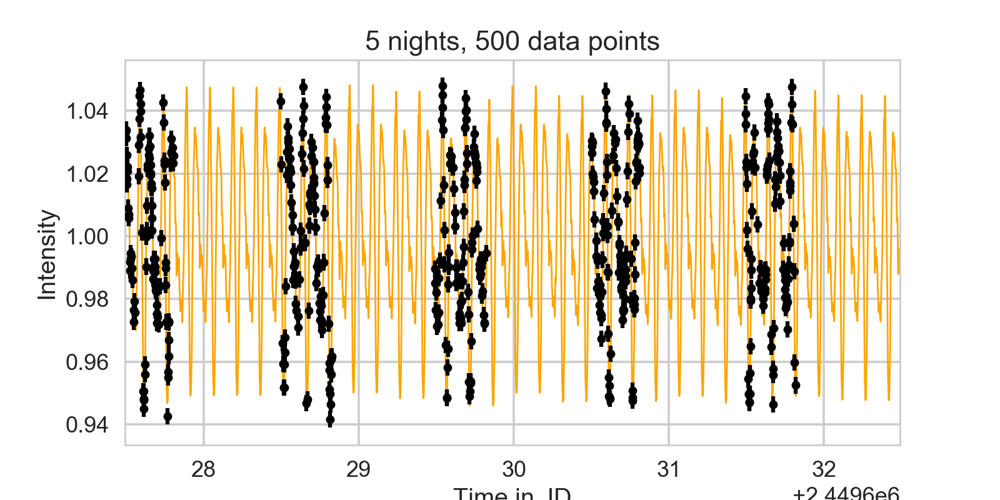

<IPython.core.display.Javascript object>


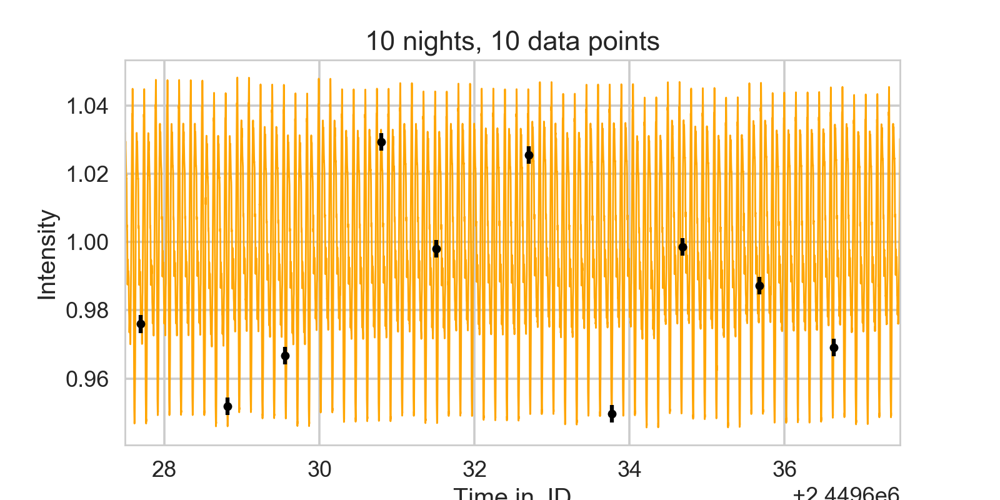

<IPython.core.display.Javascript object>


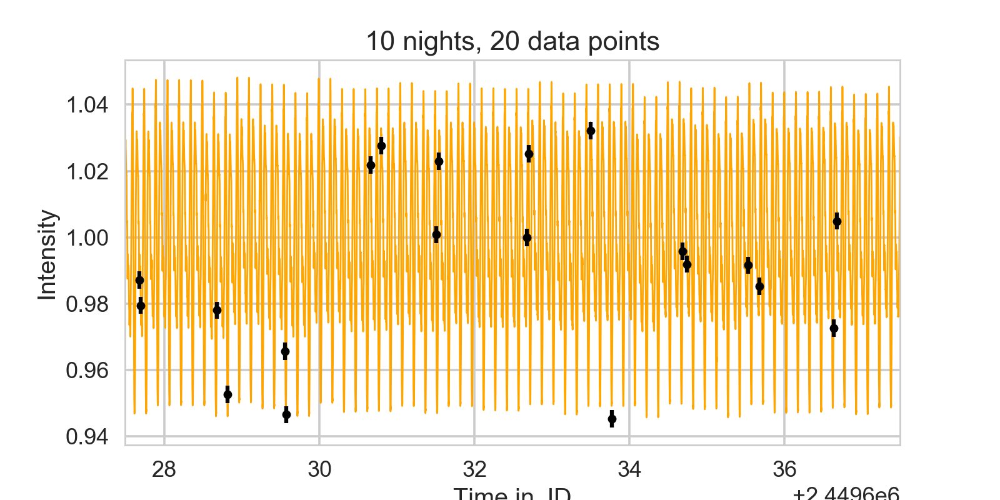

<IPython.core.display.Javascript object>


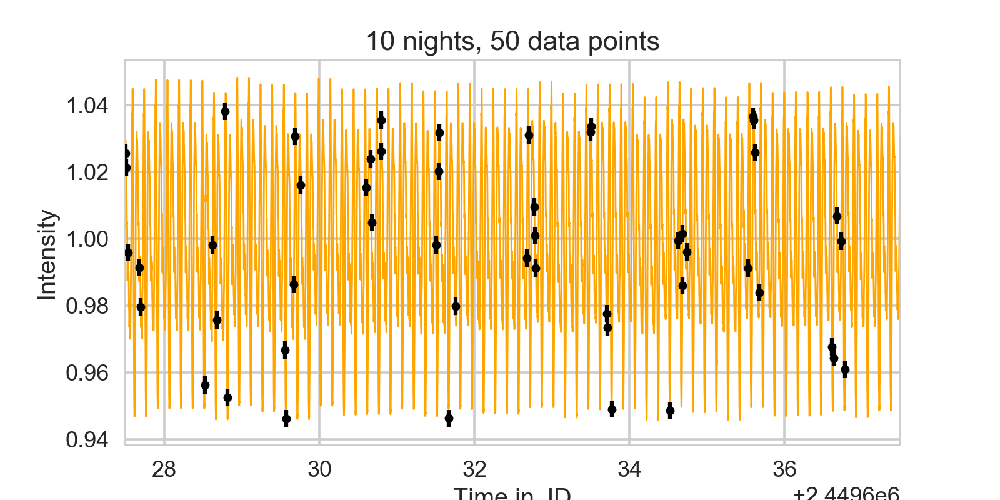

<IPython.core.display.Javascript object>


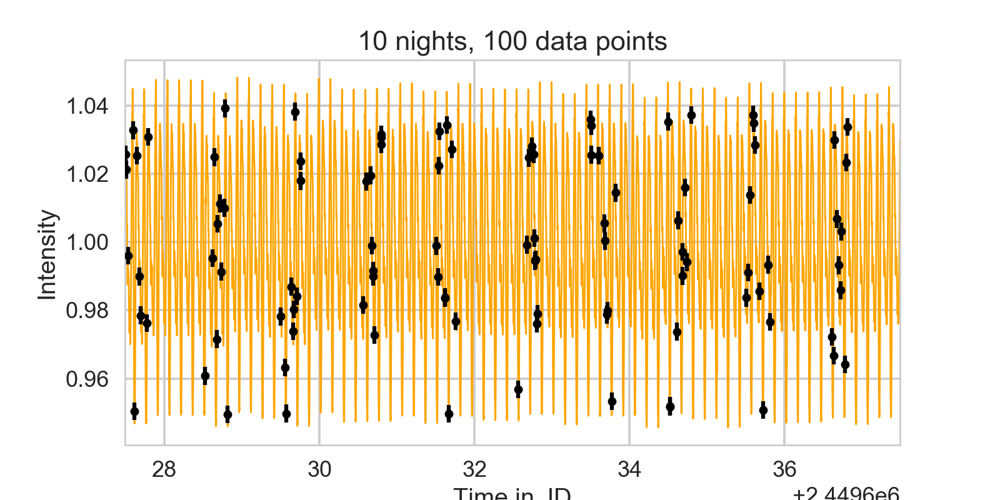

<IPython.core.display.Javascript object>


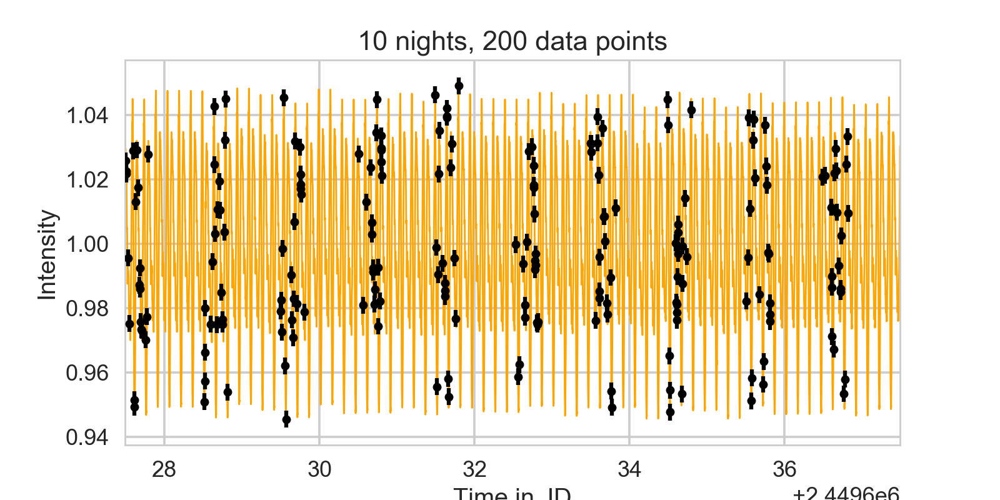

<IPython.core.display.Javascript object>


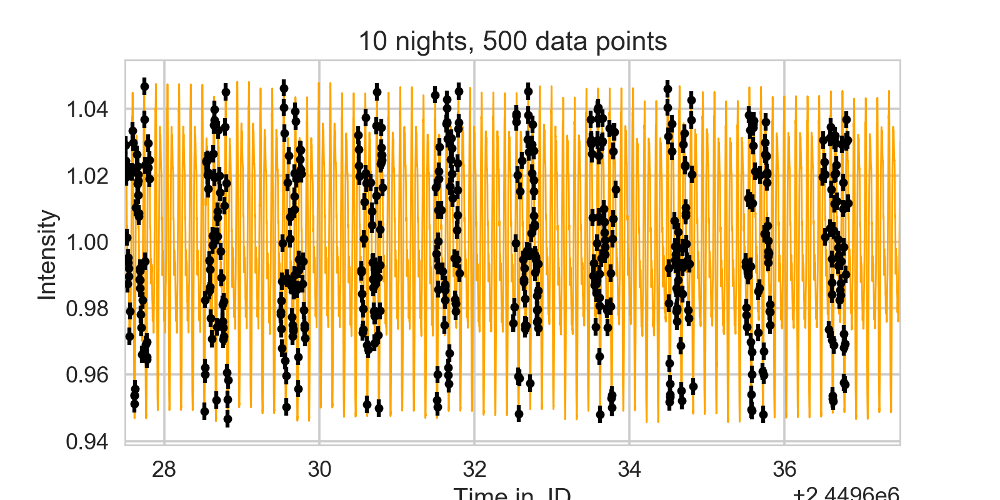

<IPython.core.display.Javascript object>


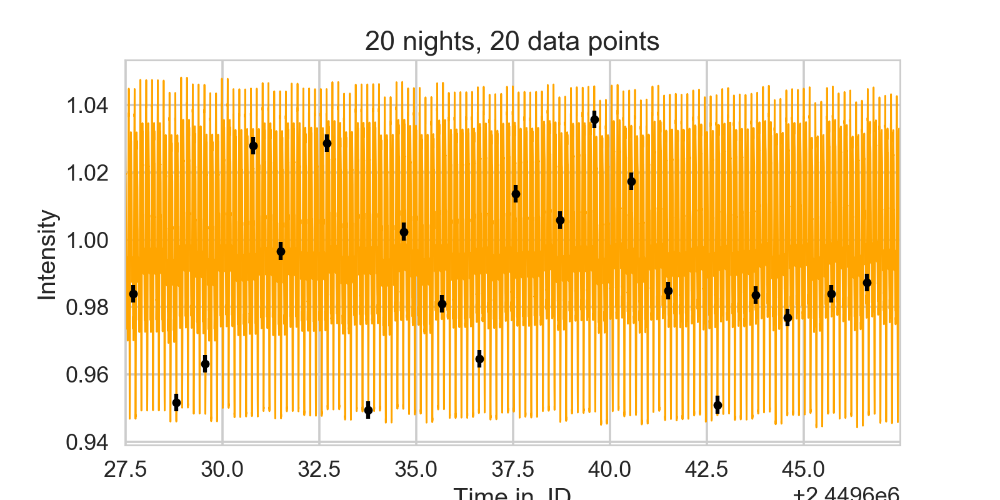

<IPython.core.display.Javascript object>


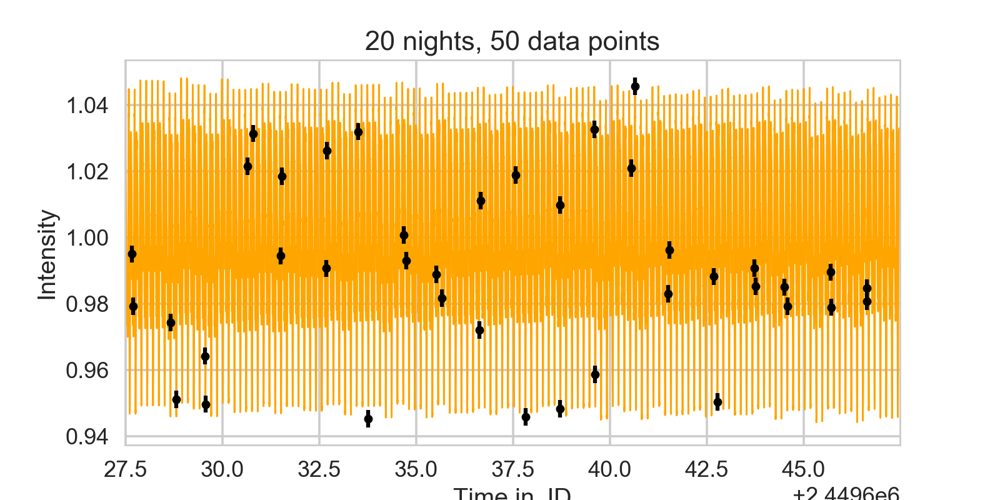

<IPython.core.display.Javascript object>


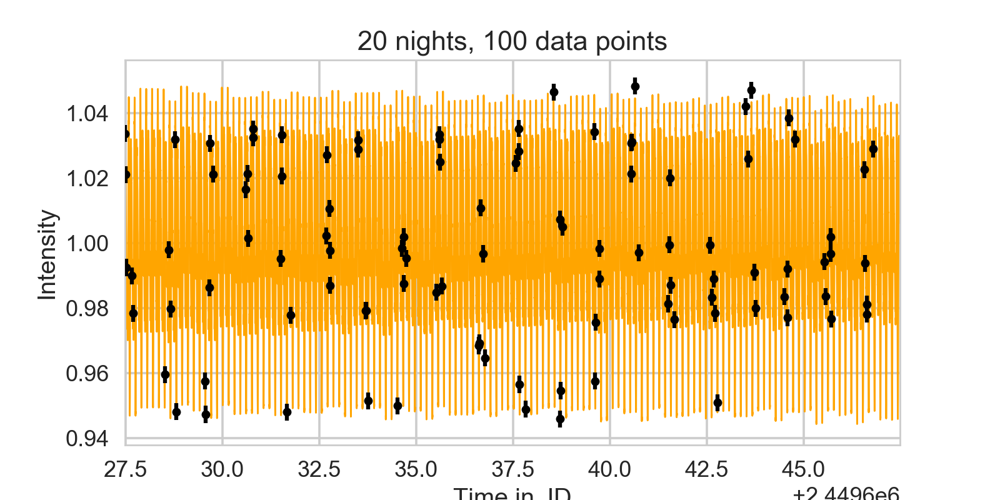

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


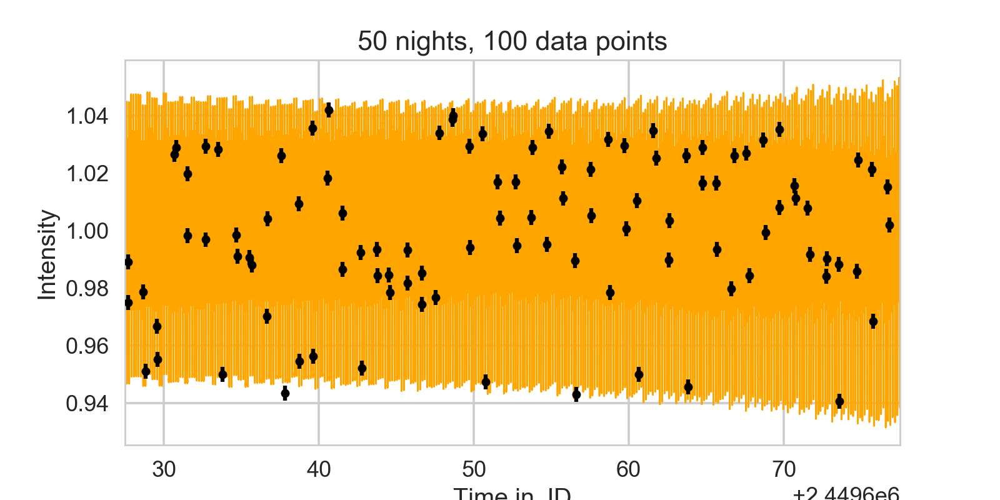

<IPython.core.display.Javascript object>


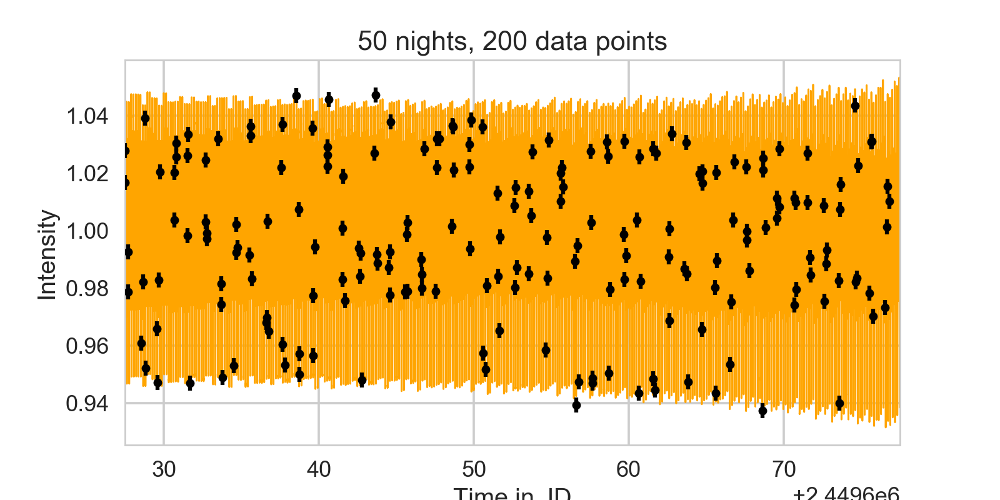

<IPython.core.display.Javascript object>


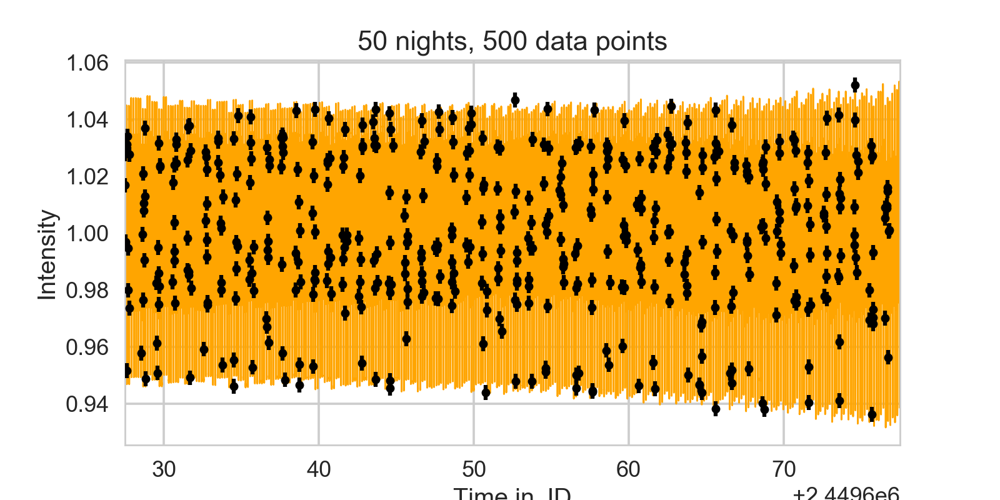

In [18]:
nights = [1, 2, 5, 10, 20, 50]
npoints = [10, 20, 50, 100, 200, 500]

sigma = np.std(flux)/10.0

for ni in nights:
    t0 = data.time[0] # start time
    tseg = ni # length of the total light curve
    tmax = t0 + tseg # last data point
    # search for last relevant data point in full time series
    max_ind = np.array(data.time).searchsorted(tmax)
    # restrict time series to only relevant nights
    tshort = np.array(data.time)[:max_ind]
    fshort = np.array(data.flux)[:max_ind]
    
    # save full-resolution light curve in a file
    np.savetxt(datadir+"3200_fullres_%inights.dat"%ni, np.array([tshort, fshort]).T)
    
    # loop through the number of data points:
    for npts in npoints:    
        
        # right now we assume to have at least a data point every night, 
        # so ignore cases where there are more nights than data points
        if ni > npts:
            continue
        # subsample the time series
        tsample, fsample, ferr = subsample(tshort, fshort, npoints=npts, kind="telescope", 
                                           seed=seed,
                                           sigma=sigma, mean_flux=0.0)
        
        fig, ax = plt.subplots(1, 1, figsize=(8,4))
        ax.errorbar(tsample, fsample, yerr=ferr, fmt="o", markersize=5, 
                    color="black", zorder=10)
        ax.plot(tshort, fshort, lw=1, color="orange")
        ax.set_title("%i nights, %i data points"%(ni, npts))
        ax.set_xlim(tshort[0], tshort[-1])
        ax.set_xlabel("Time in JD")
        ax.set_ylabel("Intensity")
        plt.savefig(datadir+"3200_random_%inights_%ipoints_data.pdf"%(ni, npts), 
                    format="pdf")
        np.savetxt(datadir+"3200_random_%inights_%ipoints.dat"%(ni, npts), 
                   np.array([tsample, fsample, ferr]).T)


Ok, cool. That looks pretty good!

## Sparse Sub-sampling

This is sampling like Bryce did with his asteroid observing campaign, where they rotated through a bunch of asteroids throughout the night. Each observation was ~3 minute long, and they observed all asteroids, then went back to the first one and started over.

We do the same thing for this case:

In [19]:
seed = 300

/opt/local/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


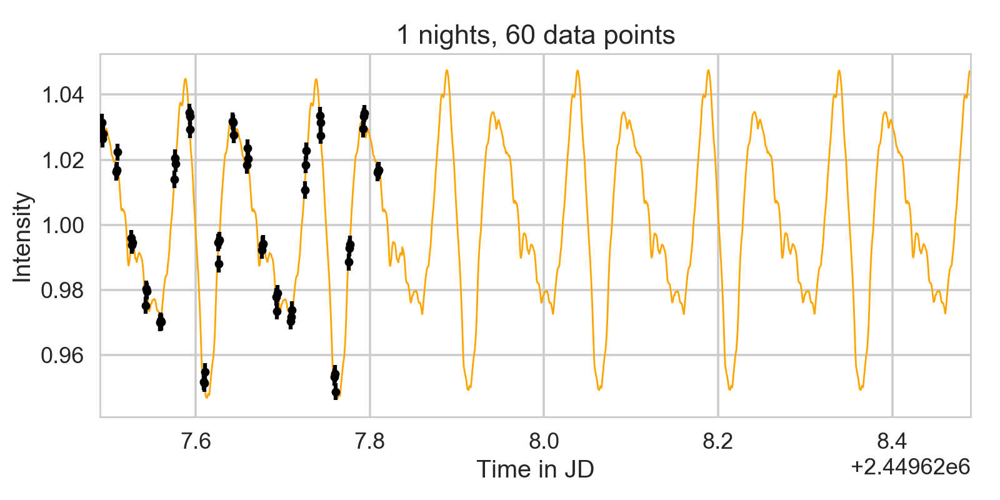

<IPython.core.display.Javascript object>


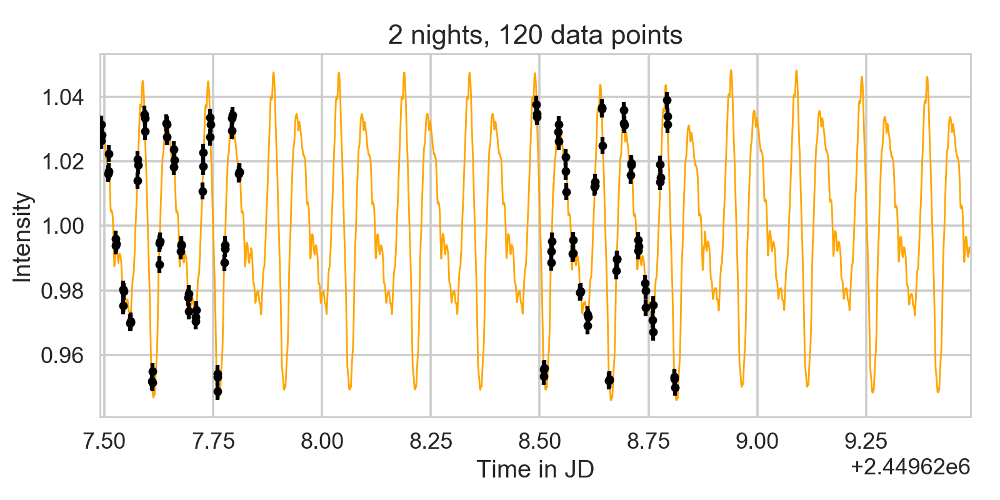

<IPython.core.display.Javascript object>


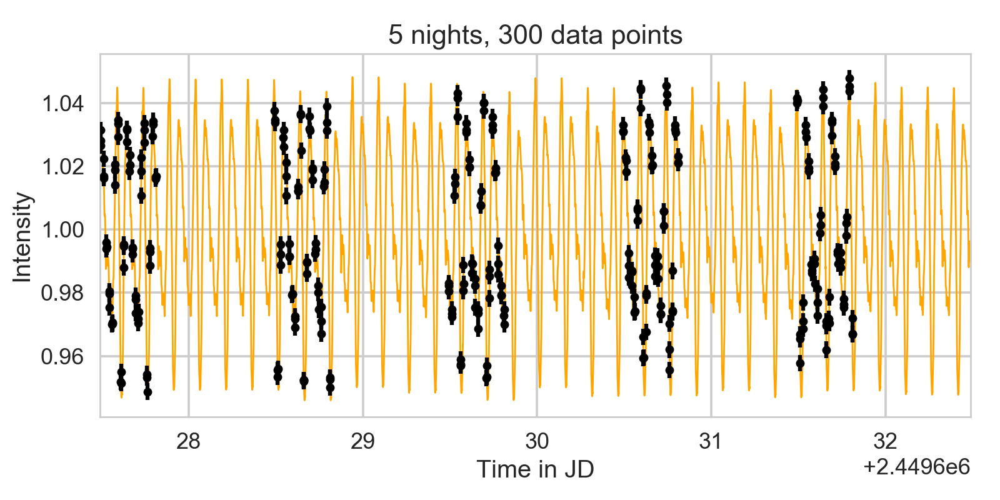

<IPython.core.display.Javascript object>


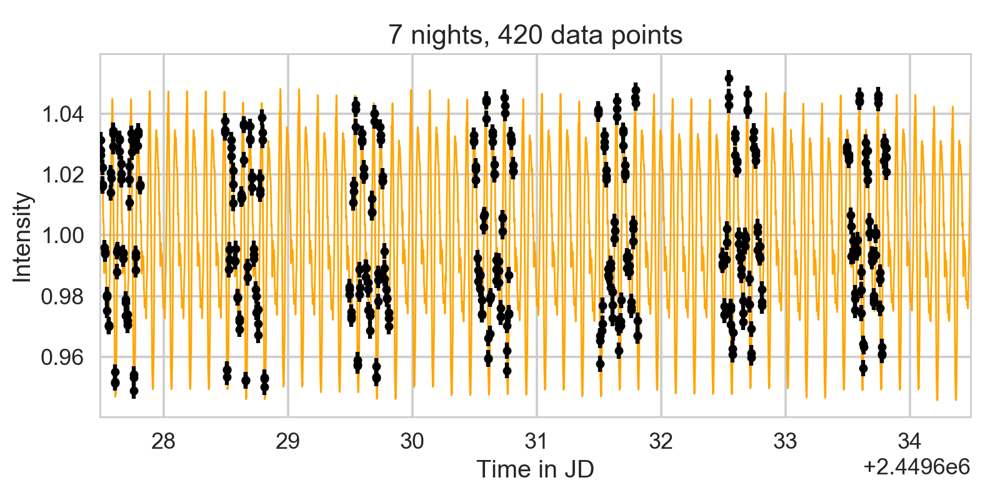

<IPython.core.display.Javascript object>


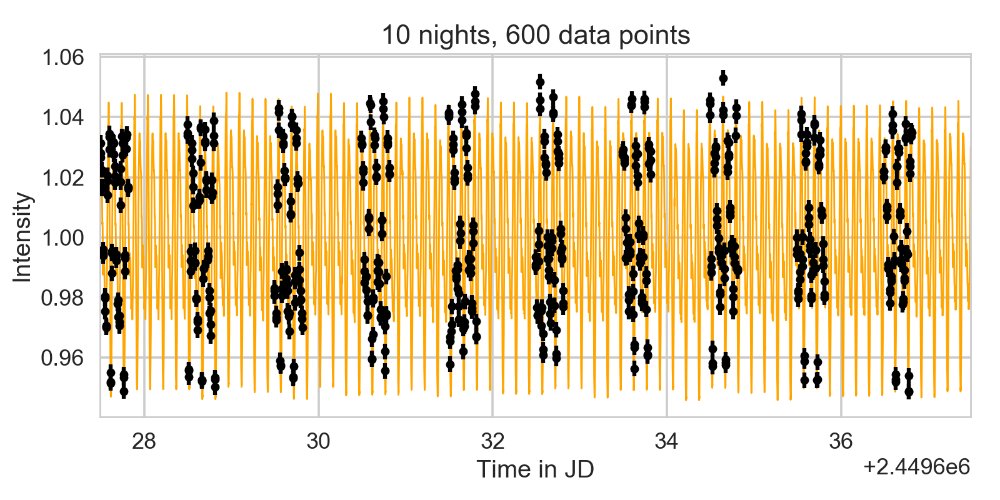

<IPython.core.display.Javascript object>


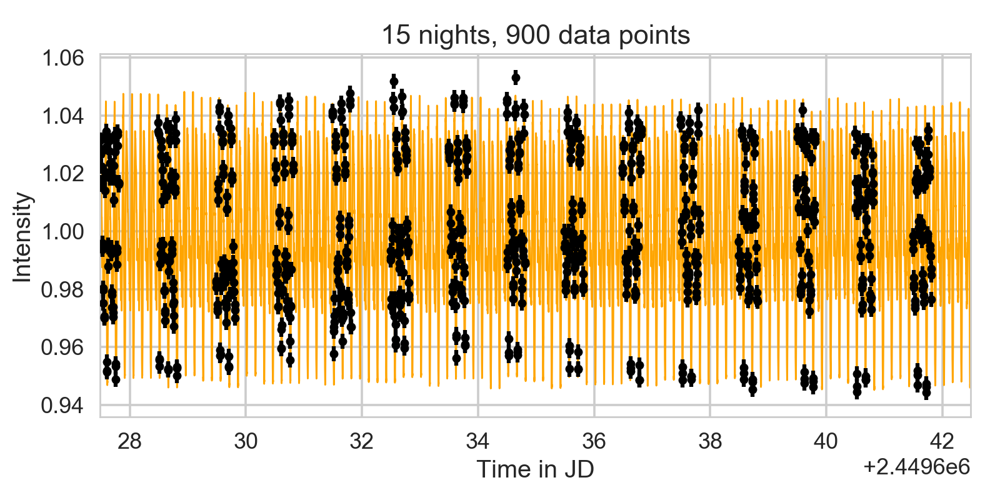

<IPython.core.display.Javascript object>


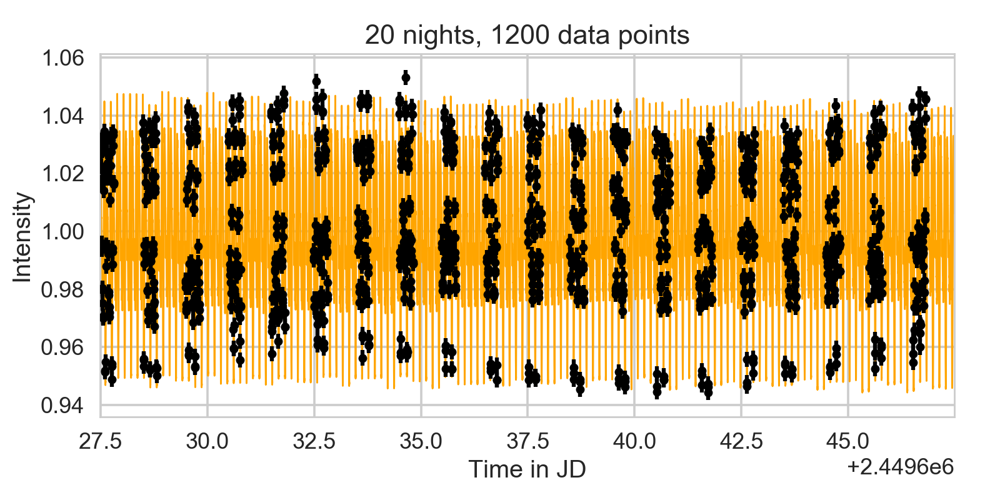

In [20]:
nights = [1, 2, 5, 7, 10, 15, 20]
#npoints = [10, 20, 50, 100, 200, 500]

sigma = np.std(flux)/10.0

for ni in nights:
    t0 = data.time[0] # start time
    tseg = ni # length of the total light curve
    tmax = t0 + tseg # last data point
    # search for last relevant data point in full time series
    max_ind = np.array(data.time).searchsorted(tmax)
    # restrict time series to only relevant nights
    tshort = np.array(data.time)[:max_ind]
    fshort = np.array(data.flux)[:max_ind]
    
    # save full-resolution light curve in a file
    np.savetxt(datadir+"3200_fullres_%inights.dat"%ni, np.array([tshort, fshort]).T)
    
    # subsample the time series
    tsample, fsample, ferr = subsample(tshort, fshort, kind="sparse", 
                                       seed=seed,
                                       sigma=sigma, mean_flux=0.0)

    fig, ax = plt.subplots(1, 1, figsize=(8,4))
    ax.errorbar(tsample, fsample, yerr=ferr, fmt="o", markersize=5, 
                color="black", zorder=10)
    ax.plot(tshort, fshort, lw=1, color="orange")
    ax.set_title("%i nights, %i data points"%(ni, len(fsample)))
    ax.set_xlim(tshort[0], tshort[-1])
    ax.set_xlabel("Time in JD")
    ax.set_ylabel("Intensity")
    plt.savefig(datadir+"3200_sparse_%inights_%ipoints_data.pdf"%(ni, len(fsample)), 
                format="pdf")
    plt.tight_layout()
    np.savetxt(datadir+"3200_sparse_%inights_%ipoints.dat"%(ni, len(fsample)), 
               np.array([tsample, fsample, ferr]).T)



## ZTF-style sampling

Let's also make some data with ztf-style sampling:

In [21]:
seed = 400

/opt/local/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


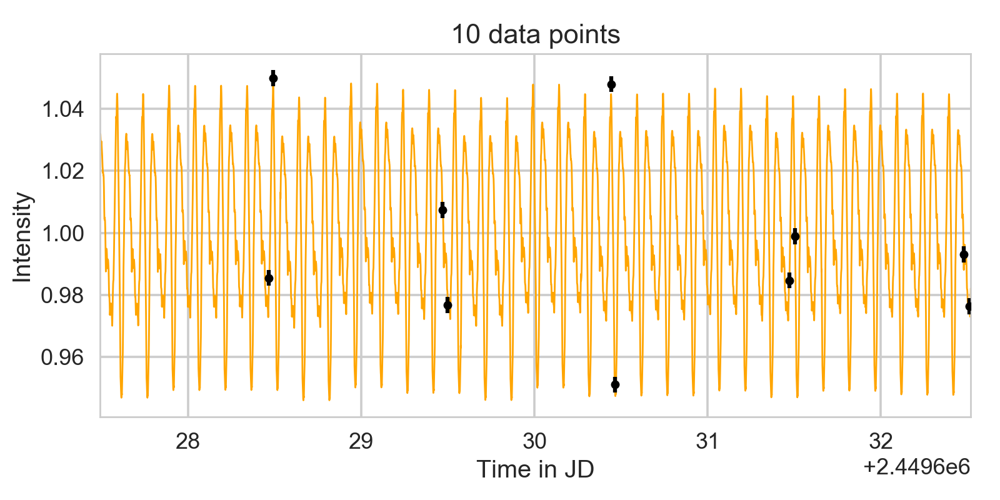

<IPython.core.display.Javascript object>


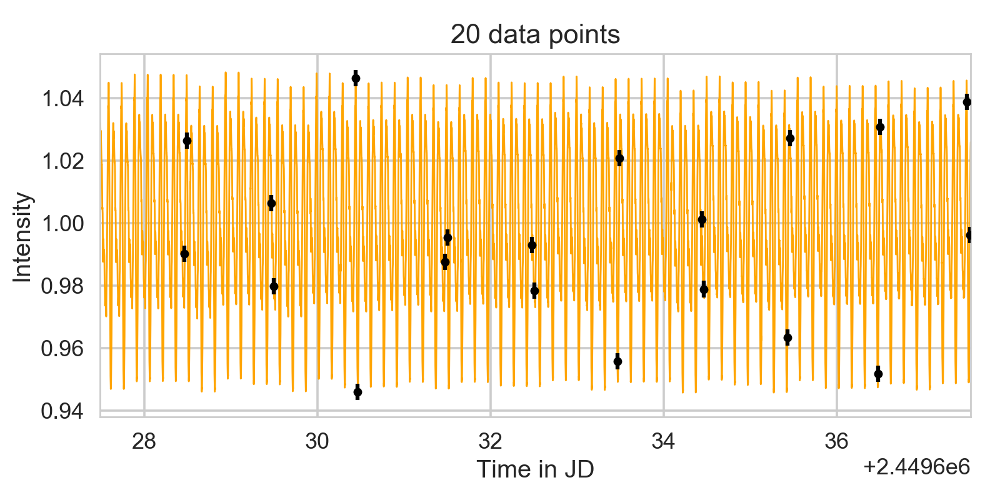

<IPython.core.display.Javascript object>


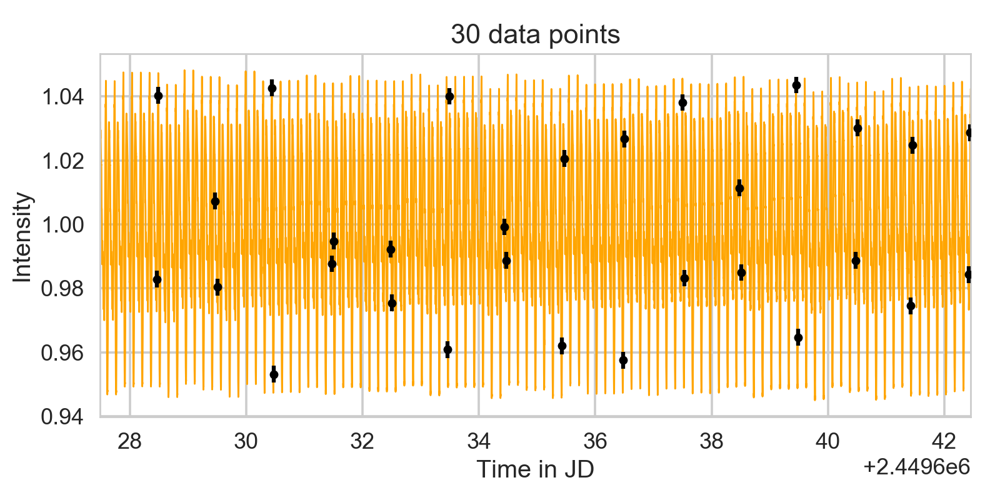

<IPython.core.display.Javascript object>


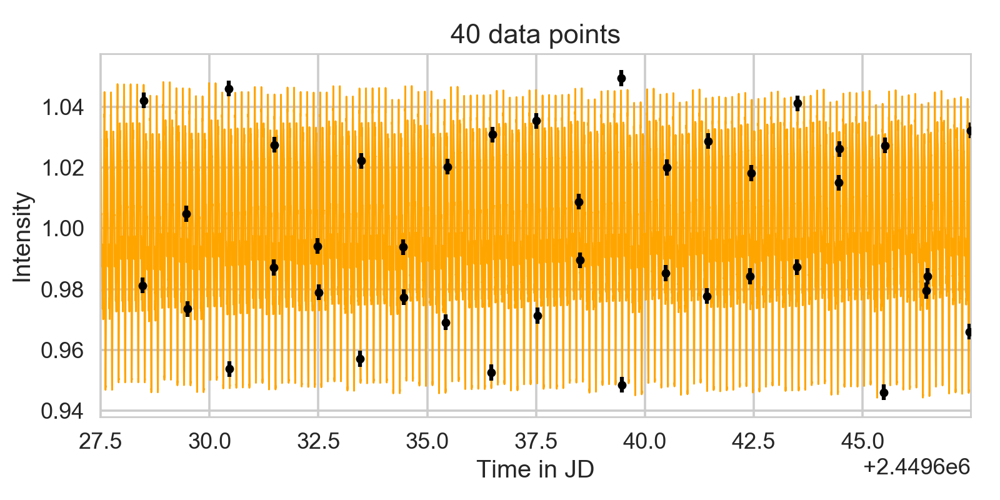

<IPython.core.display.Javascript object>


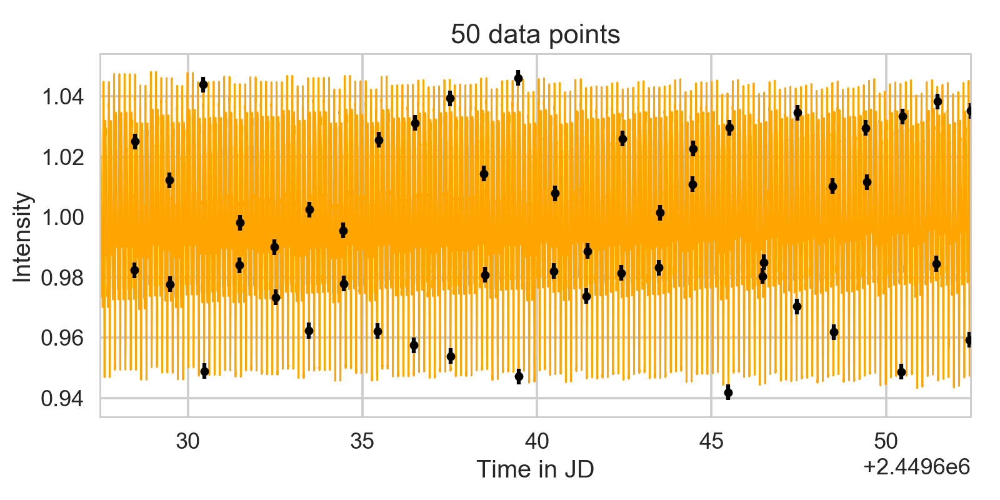

In [22]:
npoints = [10, 20, 30, 40, 50]

sigma = np.std(flux)/10.0

for npts in npoints:
    #t0 = data.time[0] # start time
    #tseg = ni # length of the total light curve
    #tmax = t0 + tseg # last data point
    # search for last relevant data point in full time series
    #max_ind = np.array(data.time).searchsorted(tmax)
    # restrict time series to only relevant nights
    #tshort = np.array(data.time)[:max_ind]
    #fshort = np.array(data.flux)[:max_ind]
    #
    # save full-resolution light curve in a file
    #np.savetxt(datadir+"3200_fullres_%inights.dat"%ni, np.array([tshort, fshort]).T)
    
    # subsample the time series
    tsample, fsample, ferr = subsample(time, flux, npoints=npts, kind="ztf", 
                                       seed=seed, dnights=[1,2],
                                       sigma=sigma, mean_flux=0.0)

    max_ind = time.searchsorted(tsample[-1]+0.01)
    tshort = time[:max_ind]
    fshort = flux[:max_ind]
    fig, ax = plt.subplots(1, 1, figsize=(8,4))
    ax.errorbar(tsample, fsample, yerr=ferr, fmt="o", markersize=5, 
                color="black", zorder=10)
    ax.plot(tshort, fshort, lw=1, color="orange")
    ax.set_title("%i data points"%(npts))
    ax.set_xlim(tshort[0], tshort[-1])
    ax.set_xlabel("Time in JD")
    ax.set_ylabel("Intensity")
    plt.savefig(datadir+"3200_ztf_%ipoints_data.pdf"%(npts), 
                format="pdf")
    plt.tight_layout()
    np.savetxt(datadir+"3200_ztf_%ipoints.dat"%(npts), 
               np.array([tsample, fsample, ferr]).T)




And that's all the light curves we want for now!